<a href="https://colab.research.google.com/github/donigantengabis/checkpoint-miniproject-datamining/blob/main/Checkpoint2_DataUnderstanding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ANALISIS TINGKAT CHURN DARI PELANGGAN PERUSAHAAN TELCO**

#**Import Library**

In [38]:
from google.colab import drive
import ipywidgets as widgets
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


#**BUSINESS UNDERSTANDING**

##**Business Objective**

Tujuan utama dari proyek ini adalah untuk mengurangi tingkat churn (pelanggan yang meninggalkan layanan) di perusahaan telekomunikasi. Dengan memahami pola dan faktor yang menyebabkan pelanggan meninggalkan layanan, perusahaan dapat mengambil langkah-langkah proaktif untuk mempertahankan pelanggan yang ada dan mencegah churn di masa depan. Hal ini akan membantu meningkatkan retensi pelanggan, memperkuat pendapatan, dan membangun keunggulan kompetitif.

##**Assess Situation**

Saat ini, perusahaan menghadapi tingkat churn yang signifikan di antara pelanggan mereka. Hal ini dapat mengindikasikan masalah dalam pengalaman pelanggan, kualitas layanan, atau bahkan faktor eksternal seperti persaingan pasar. Analisis lebih lanjut diperlukan untuk memahami alasan di balik churn tersebut. Data internal perusahaan, seperti riwayat penggunaan layanan, profil pelanggan, dan interaksi pelanggan, mungkin akan menjadi sumber informasi utama.

##**Data Mining Goals**

1. Identifikasi Faktor Churn: Mengidentifikasi faktor-faktor yang paling berkontribusi terhadap churn, baik dari segi karakteristik pelanggan (misalnya, lama berlangganan, jenis paket, tingkat penggunaan) maupun pengalaman pelanggan (misalnya, keluhan, interaksi dengan layanan pelanggan).
2. Pembuatan Model Prediktif: Membangun model prediktif yang dapat memperkirakan pelanggan mana yang memiliki risiko tinggi untuk churn di masa mendatang. Ini memungkinkan perusahaan untuk mengambil tindakan pencegahan secara proaktif.
3. Segmentasi Pelanggan: Mengidentifikasi segmentasi pelanggan berdasarkan perilaku dan karakteristik mereka. Ini membantu dalam menyesuaikan strategi retensi yang lebih efektif untuk setiap kelompok pelanggan.
4. Analisis Keseluruhan Perilaku Pelanggan: Menganalisis pola perilaku pelanggan sebelum mereka memutuskan untuk meninggalkan layanan, termasuk tren penggunaan layanan, frekuensi interaksi, dan tingkat kepuasan pelanggan.

##**Project Plan**

1. Data Collection: Mengumpulkan data historis pelanggan yang mencakup riwayat penggunaan layanan, profil pelanggan, interaksi pelanggan, dan data terkait lainnya.
2. Data Preprocessing: Membersihkan data dari nilai-nilai yang hilang atau tidak valid, melakukan transformasi jika diperlukan, dan menyiapkan data untuk analisis lebih lanjut.
3. Exploratory Data Analysis (EDA): Menganalisis data untuk mengidentifikasi pola, anomali, dan korelasi antara variabel. Ini akan membantu dalam pemahaman awal tentang faktor-faktor yang terkait dengan churn.
4. Model Development: Mengembangkan model prediktif menggunakan teknik seperti regresi logistik, pohon keputusan, atau algoritma machine learning lainnya untuk memprediksi pelanggan yang berpotensi churn.
5. Evaluation: Mengevaluasi kinerja model menggunakan metrik seperti akurasi, presisi, recall, dan F1-score. Memvalidasi model dengan menggunakan data yang tidak terlihat sebelumnya untuk menghindari overfitting.
6. Segmentation Analysis: Menganalisis data untuk mengidentifikasi kelompok pelanggan yang berbeda berdasarkan perilaku dan karakteristik mereka.
7. Actionable Insights: Menggunakan hasil analisis untuk merumuskan strategi retensi yang lebih efektif, seperti program loyalitas, penawaran khusus, atau perbaikan layanan.
8. Monitoring and Optimization: Memantau efektivitas strategi retensi yang diimplementasikan dan melakukan penyesuaian jika diperlukan. Terus mengupdate model prediktif dengan data terbaru untuk menjaga relevansi dan kinerja.

#**DATA UNDERSTANDING**

##**Collect Initial Data**

Dataset yang akan dianalisis dalam project ini berasal dari situs yang bernama _Kaggle.com_ . Dataset yang didapatkan ini merupakan sebuah sumber data fiksional dari perusahaan Telco yang menyediakan layanan Internet dan Telepon Rumah kepada 7043 pelanggan di California.

Berikut linknya : [Klik disini](https://www.kaggle.com/datasets/yeanzc/telco-customer-churn-ibm-dataset/data)

In [39]:
df = pd.read_excel(r'/content/gdrive/My Drive/Colab Notebooks/Telco_customer_churn.xlsx')
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


##**Describe Data**

####Informasi Dasar

In [41]:
num_rows, num_cols = df.shape
rows_widget = widgets.IntText(value=num_rows, description='Baris:', disabled=True)
cols_widget = widgets.IntText(value=num_cols, description='Kolom:', disabled=True)
display(rows_widget, cols_widget)

IntText(value=7043, description='Baris:', disabled=True)

IntText(value=33, description='Kolom:', disabled=True)

Dataset yang sedang dianalisis kali ini memiliki total jumlah kolom yaitu sebanyak 33 (tiga puluh tiga) dan baris sebanyak 7043 (tujuh ribu empat puluh tiga)



####Informasi Lanjutan

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

1. CustomerID: ID unik untuk setiap pelanggan. Tipe data: object (string).

2. Count: Jumlah data yang dihitung. Tipe data: int64 (integer).

3. Country: Negara tempat pelanggan tinggal. Tipe data: object (string).

4. State: Negara bagian atau wilayah tempat pelanggan tinggal. Tipe data: object (string).

5. City: Kota tempat pelanggan tinggal. Tipe data: object (string).

6. Zip Code: Kode pos tempat pelanggan tinggal. Tipe data: int64 (integer).

7. Lat Long: Koordinat lintang dan bujur pelanggan. Tipe data: object (string).

8. Latitude: Koordinat lintang pelanggan. Tipe data: float64 (float).

9. Longitude: Koordinat bujur pelanggan. Tipe data: float64 (float).

10. Gender: Jenis kelamin pelanggan. Tipe data: object (string).

11. Senior Citizen: Menunjukkan apakah pelanggan adalah warga senior atau tidak. Tipe data: object (string).

12. Partner: Menunjukkan apakah pelanggan memiliki pasangan atau tidak. Tipe data: object (string).

13. Dependents: Menunjukkan apakah pelanggan memiliki tanggungan atau tidak. Tipe data: object (string).

14. Tenure Months: Jumlah bulan pelanggan telah menjadi pelanggan. Tipe data: int64 (integer).

15. Phone Service: Menunjukkan apakah pelanggan memiliki layanan telepon atau tidak. Tipe data: object (string).

16. Multiple Lines: Menunjukkan apakah pelanggan memiliki beberapa saluran telepon atau tidak. Tipe data: object (string).

17. Internet Service: Jenis layanan internet yang digunakan oleh pelanggan. Tipe data: object (string).

18. Online Security: Menunjukkan apakah pelanggan memiliki keamanan online atau tidak. Tipe data: object (string).

19. Online Backup: Menunjukkan apakah pelanggan memiliki cadangan online atau tidak. Tipe data: object (string).

20. Device Protection: Menunjukkan apakah pelanggan memiliki perlindungan perangkat atau tidak. Tipe data: object (string).

21. Tech Support: Menunjukkan apakah pelanggan memiliki dukungan teknis atau tidak. Tipe data: object (string).

22. Streaming TV: Menunjukkan apakah pelanggan memiliki layanan streaming TV atau tidak. Tipe data: object (string).

23. Streaming Movies: Menunjukkan apakah pelanggan memiliki layanan streaming film atau tidak. Tipe data: object (string).

24. Contract: Jenis kontrak yang dimiliki pelanggan. Tipe data: object (string).

25. Paperless Billing: Menunjukkan apakah pelanggan menggunakan tagihan tanpa kertas atau tidak. Tipe data: object (string).

26. Payment Method: Metode pembayaran yang digunakan oleh pelanggan. Tipe data: object (string).

27. Monthly Charges: Biaya bulanan yang dibebankan kepada pelanggan. Tipe data: float64 (float).

28. Total Charges: Total biaya yang dibebankan kepada pelanggan. Tipe data: object (string).

29. Churn Label: Menunjukkan apakah pelanggan berhenti berlangganan atau tidak. Tipe data: object (string).

30. Churn Value: Nilai yang menunjukkan apakah pelanggan berhenti berlangganan atau tidak (1 untuk Ya, 0 untuk Tidak). Tipe data: int64 (integer).

31. Churn Score: Skor yang menunjukkan kemungkinan pelanggan berhenti berlangganan. Tipe data: int64 (integer).

32. CLTV: Nilai seumur hidup pelanggan. Tipe data: int64 (integer).

33. Churn Reason: Alasan mengapa pelanggan berhenti berlangganan (jika berlaku). Tipe data: object (string).

**Semua kolom data diatas terisi baris 7043 data (non null) kecuali pada kolom _Churn Reason_ yang terisi 1869 baris data.**

####Informasi Statistik Deskriptif

In [43]:
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


* Count: Setiap baris dalam dataset mewakili satu pelanggan.

* Zip Code: Kode pos tempat tinggal pelanggan, dengan rata-rata sekitar 93521.

* Latitude: Garis lintang tempat tinggal pelanggan, dengan rata-rata sekitar 36.28.

* Longitude: Garis bujur tempat tinggal pelanggan, dengan rata-rata sekitar -119.80.

* Tenure Months: Jumlah bulan pelanggan telah menggunakan layanan, dengan rata-rata sekitar 32.37 bulan.

* Monthly Charges: Biaya bulanan yang dibebankan kepada pelanggan, dengan rata-rata sekitar $64.76.

* Churn Value: Menunjukkan apakah pelanggan berhenti berlangganan (1 untuk Ya, 0 untuk Tidak), sekitar 26.5% pelanggan telah berhenti berlangganan.

* Churn Score: Skor yang menunjukkan kemungkinan pelanggan berhenti berlangganan, dengan rata-rata sekitar 58.70.

* CLTV: Nilai waktu hidup pelanggan, dengan rata-rata sekitar 4400.30.

##**Exploratory Data Analysis**

In [44]:
Churn_Label_counts= df['Churn Label'].value_counts()
fig2 = px.pie(names= Churn_Label_counts.keys(), values= Churn_Label_counts.values, title='Persebaran Data Churn Label')
fig2.show()

Sebanyak 26.5% pelanggan atau lebih tepatnya 1869 pelanggan telah meninggalkan layanan perusahaan. Kita perlu mencari tahu apa alasan dari mereka meniggalkan layanan perusahaan.

In [45]:
values= df['Churn Reason'].value_counts(ascending=False).values
keys= df['Churn Reason'].value_counts(ascending=False).keys()

fig = px.bar(x=keys, y=values, color = values, text = values)

fig.update_layout(
    yaxis_title="Churn Reason",
    xaxis_title="Jumlah"
)
fig.show()

Terdapat 2 faktor yang menjadi penyebab pelanggan berhenti dari layanan:
*   Internal
*   External

Faktor internal bisa berupa dari kualitas layanan yang kita jual sendiri dan faktor external dapat berupa kompetitor yang menyaingi perusahaan kita sendiri, untuk itu kualitas dari layanan perusahaan perlu ditingkatkan dengan tujuan memuaskan pelanggan dan juga menyaingi produk layanan perusahaan lain untuk menarik pelanggan pelanggan baru.

In [46]:
contingency_table = pd.crosstab(df['Churn Reason'], df['City'])
top_10_cities = contingency_table.sum().nlargest(10).index
contingency_table_top_10 = contingency_table[top_10_cities]
contingency_table_top_10 = contingency_table_top_10.reset_index()
fig = px.bar(contingency_table_top_10, x='Churn Reason', y=top_10_cities, title='Churn Reason dari 10 Kota',
             labels={'Churn Reason': 'Churn Reason', 'value': 'Jumlah', 'variable': 'Kota'},
             barmode='stack')
fig.show()

Dari visualisasi ini, kita dapat melihat perbandingan jumlah churn reason di antara kota-kota teratas, yang dapat membantu dalam memahami tren churn dan memprioritaskan area-area mana yang perlu perbaikan pelayanan. Sebagai contohnya dari kota Los Angeles dibutuhkan kualitas layanan yang lebih baik dikarenakan banyak pelanggan yang berhenti dari layanan dengan alasan memilih produk dari perusahaan lain dan kurangnya kualitas layanan dari kita.

##**Verify Data Quality**

####Missing Values

In [47]:
missing_values = df.isnull().sum().reset_index()
missing_values.columns = ['Kolom', 'kosong']
fig = px.bar(missing_values, x='Kolom', y='kosong',
             title='Data yang Kosong dalam Dataset',
             labels={'kosong': 'Jumlah Data Kosong'})
fig.update_layout(xaxis_title='Kolom', yaxis_title='Jumlah Data yang Kosong')
fig.show()

Semua kolom data dalam dataset ini rata-rata terisi semua (tidak ada yang kosong) selain kolom _Churn Reason_ dengan jumlah data yang kosong yaitu sebanyak 5174 baris data.

####Outliers Values

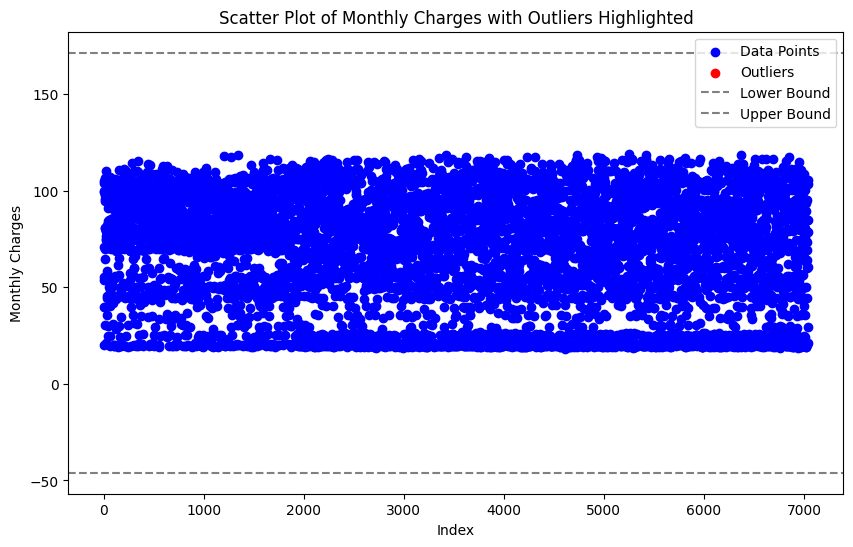

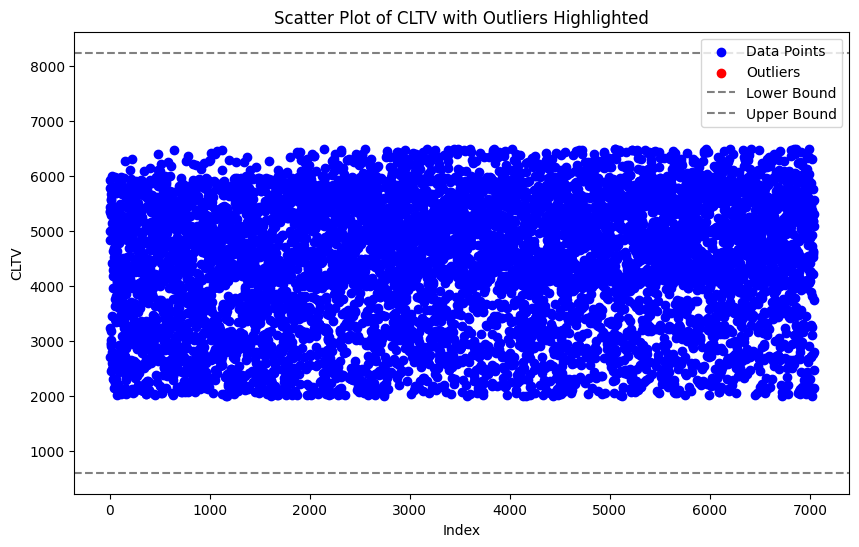

In [48]:
columns_to_check = ['Monthly Charges', 'CLTV']

for column in columns_to_check:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[column], color='blue', label='Data Points')
    plt.scatter(outliers.index, outliers[column], color='red', label='Outliers')
    plt.axhline(y=lower_bound, color='gray', linestyle='--', label='Lower Bound')
    plt.axhline(y=upper_bound, color='gray', linestyle='--', label='Upper Bound')
    plt.title(f'Scatter Plot of {column} with Outliers Highlighted')
    plt.xlabel('Index')
    plt.ylabel(column)
    plt.legend()
    plt.show()

Dari visualisasi diatas menunjukkan bahwa pelanggan memiliki biaya bulanan _Monthly Charges_ dan nilai waktu hidup _CLTV_ yang beragam, tetapi tidak ada nilai yang dianggap sebagai outliers. Oleh karena itu, tidak perlu dilakukan tindakan lebih lanjut terkait dengan outliers dalam kedua kolom tersebut.

####Duplicated Values

In [49]:
for column in df.columns:
    value_counts = df[column].value_counts()
    fig = px.scatter(x=value_counts.index, y=value_counts.values, labels={'x': column, 'y': 'Frequency'}, title=f'Scatter Plot of {column}')
    fig.update_traces(mode='markers', marker=dict(size=8))
    fig.show()

Dari visualisasi scatter plot diatas, dapat dilihat bahwa data-data yang ditampilkan cukup beragam dan juga ada duplikasi yang jumlahnya tidak sedikit. Tetapi duplikasi tersebut tidak menurunkan kualitas data yang dimiliki karena memang tidak memengaruhi apapun. Untuk detail dari berapa jumlah data terduplikasi anda bisa mengarahkan kursor ke titik dari visual data diatas.

####Inconsistent Values / Noise (Optional)

In [50]:
df_numeric = df.apply(pd.to_numeric, errors='coerce')
fig = px.box(df_numeric, title='Box Plot of Data')
fig.show()
fig = px.violin(df_numeric, title='Violin Plot of Data')
fig.show()

Dari visualisasi diatas dapat dilihat bahwa distribusi nilai dalam data tidak ada yang berbeda secara signifikan sehingga tidak ditemukan adanya noise